
  # Notebook 25 (v2) — Fusion sémantique × matériaux × couleur — **albédo sourcé**

 **Corrections apportées par rapport à la v1 :**
#
 | Problème signalé | Correction |
 |---|---|
 | Valeurs d'albédo inventées | **Table entièrement sourcée** : chaque valeur porte sa référence. Matériaux **sans source fiable → exclus (NaN)**, pas de valeur inventée |
 | Végétation illogique | **Albédo fixe, sans modulation par luminance** — la réflectance solaire du feuillage est dominée par le proche infrarouge, invisible en RGB |
 | Confusion asphalt / cement / paint | `Paint` **retiré** des matériaux plausibles au sol (gating). La confusion asphalt↔cement est **mesurée et rapportée** (section 3), non masquée |
 | Skin/Hair classés Cloth | Pixels de classe `person` — **déjà exclus** de l'albédo, sans impact thermique. Documenté section 3 |
 | Règles de gating écrites à la main | Section 3 : **crosstab GT × BFMS mesuré sur vos 116 images** pour objectiver les règles avant de les fixer |

 **Limite assumée :** BFMS n'est pas réentraîné ici. Le gating **filtre** ses erreurs, il ne les corrige pas à la source. Les confusions entre deux matériaux également plausibles pour une même classe (asphalte vs béton au sol) restent non résolues — elles sont quantifiées section 3.




In [16]:
import time, random
from pathlib import Path

import numpy as np
import cv2
import torch
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device : {device}")

PROJECT_ROOT = Path("..").resolve()

DATASET_DIR  = PROJECT_ROOT / "data" / "outputs" / "dataset_coolpath_360"
IMG_DIR      = DATASET_DIR / "candidate_frames" # path de 1041 images 
LBL_DIR      = DATASET_DIR / "labels"
SEM_WORK_DIR = PROJECT_ROOT / "data" / "outputs" / "final_training_m2f"
BFMS_DIR     = PROJECT_ROOT / "data" / "outputs" / "bfms_materials_1041" / "masks_bfms"

OUTPUT_DIR    = PROJECT_ROOT / "data" / "outputs" / "fusion_3models_v2_1041"
SEM_MASKS_DIR = OUTPUT_DIR / "masks_semantic"
FUSED_DIR     = OUTPUT_DIR / "masks_fused"
ALBEDO_DIR    = OUTPUT_DIR / "albedo"
VIZ_DIR       = OUTPUT_DIR / "viz"
for d in (OUTPUT_DIR, SEM_MASKS_DIR, FUSED_DIR, ALBEDO_DIR, VIZ_DIR):
    d.mkdir(parents=True, exist_ok=True)

assert IMG_DIR.exists(), f"Dataset introuvable : {IMG_DIR} (nb23)"
assert BFMS_DIR.exists() and any(BFMS_DIR.glob("*_bfms.png")), \
    f"Masques BFMS introuvables : {BFMS_DIR} (executer nb24)"

image_paths = sorted(list(IMG_DIR.glob("*.jpg")) + list(IMG_DIR.glob("*.png")))
print(f"{len(image_paths)} images | {len(list(BFMS_DIR.glob('*_bfms.png')))} masques BFMS")

USE_GT_SEMANTIC = False   # False = predictions nb23 (production) ; True = GT (borne superieure)
print(f"Source semantique : {'GT' if USE_GT_SEMANTIC else 'predictions nb23'}")

# Constantes semantiques (Cityscapes officiel) :
#   8 vegetation = arbres/haies (vegetation VERTICALE)
#   9 terrain    = herbe/sol nu (vegetation HORIZONTALE)
SEM_ROAD, SEM_SIDEWALK, SEM_VEGETATION, SEM_TERRAIN, SEM_SKY = 0, 1, 8, 9, 10


Device : cuda
1041 images | 1041 masques BFMS
Source semantique : predictions nb23


In [17]:

CITYSCAPES_ORDER = [
    "road", "sidewalk", "building", "wall", "fence", "pole", "traffic_light",
    "traffic_sign", "vegetation", "terrain", "sky", "person", "rider",
    "car", "truck", "bus", "train", "motorcycle", "bicycle",
]
CITYSCAPES_PALETTE = np.array([
    [128,64,128],[244,35,232],[70,70,70],[102,102,156],[190,153,153],
    [153,153,153],[250,170,30],[220,220,0],[107,142,35],[152,251,152],
    [70,130,180],[220,20,60],[255,0,0],[0,0,142],[0,0,70],
    [0,60,100],[0,80,100],[0,0,230],[119,11,32],
], dtype=np.uint8)

BFMS_COLORS = np.array([
    (0,0,0),(139,69,19),(205,133,63),(178,34,34),(210,180,140),
    (34,139,34),(255,165,0),(255,215,0),(0,0,128),(128,128,128),
    (192,192,192),(255,105,180),(139,0,0),(75,0,130),(0,191,255),
    (70,130,180),(0,128,0),(255,20,147),(160,82,45),(184,134,11),
    (0,255,255),(255,192,203),(0,100,0),(176,224,230),(139,69,19),
    (205,92,92),(192,192,192),(255,250,250),(255,0,255),(173,216,230),
    (255,228,196),(245,245,245),(255,239,213),(135,206,250),(105,105,105),
    (128,0,128),(194,178,128),(255,182,193),(135,206,235),(255,250,250),
    (128,128,0),(139,69,19),(169,169,169),
], dtype=np.uint8)

BFMS_ID2LABEL = {
    0:"Background",1:"Wood/Bamboo",2:"Ground tile",3:"Brick",4:"Cardboard/Paper",
    5:"Tree",6:"Roof tile",7:"Ceramic",8:"Chalkboard/Blackboard",9:"Asphalt",
    10:"Cement/Concrete",11:"Composite decorative board",12:"Rammed earth",
    13:"Fabric/Cloth",14:"Water",15:"Windows with metal fences",16:"Foliage",
    17:"Food",18:"Fur",19:"Pottery",20:"Glass",21:"Hair",
    22:"Roofing waterproof material",23:"Ice",24:"Leather",25:"Carved brick",
    26:"Metal",27:"Mirror",28:"Enamel",29:"Paint/Coating/Plaster",30:"Window screen",
    31:"Whiteboard",32:"Photograph/Painting/Airbrushed fabric",33:"Plastic, clear",
    34:"Plastic, non-clear",35:"Rubber/Latex",36:"Sand",37:"Skin/Lips",
    38:"Sky",39:"Snow",40:"Engineered Stone/Imitation Stone",41:"Soil/Mud",
    42:"Natural Stone",
}
BFMS_NAMES = [BFMS_ID2LABEL[i] for i in range(43)]
B = {name: i for i, name in enumerate(BFMS_NAMES)}


# ---- Branche semantique ----
if not USE_GT_SEMANTIC:
    from mmseg.apis import init_model, inference_model
    final_cfg = SEM_WORK_DIR / "mask2former_coolpath_final.py"
    best_ckpts = sorted(SEM_WORK_DIR.glob("best_mIoU_iter_*.pth"),
                        key=lambda p: int(p.stem.split("_")[-1]))
    assert final_cfg.exists() and best_ckpts, f"Config/checkpoint nb23 introuvables : {SEM_WORK_DIR}"
    BEST_CKPT = best_ckpts[-1]
    todo = [p for p in image_paths if not (SEM_MASKS_DIR / f"{p.stem}_sem.png").exists()]
    if todo:
        print(f"Inference semantique ({BEST_CKPT.name}) sur {len(todo)} images...")
        model = init_model(str(final_cfg), str(BEST_CKPT), device=device)
        for i, p in enumerate(todo, 1):
            res = inference_model(model, str(p))
            cv2.imwrite(str(SEM_MASKS_DIR / f"{p.stem}_sem.png"),
                        res.pred_sem_seg.data.squeeze().cpu().numpy().astype(np.uint8))
            if i % 20 == 0: print(f"  [{i}/{len(todo)}]"); torch.cuda.empty_cache()
        del model; torch.cuda.empty_cache()
    else:
        print("Masques semantiques deja presents")

def load_semantic(stem):
    if USE_GT_SEMANTIC:
        return np.array(Image.open(LBL_DIR / f"{stem}.png"))
    return cv2.imread(str(SEM_MASKS_DIR / f"{stem}_sem.png"), cv2.IMREAD_GRAYSCALE)

def load_color(p):
    img_bgr = cv2.imread(str(p))
    rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    f = rgb.astype(np.float64)
    lum = 0.299 * f[..., 0] + 0.587 * f[..., 1] + 0.114 * f[..., 2]
    return rgb, lum

print(f"{len(CITYSCAPES_ORDER)} classes semantiques | {len(BFMS_NAMES)} materiaux BFMS")


Masques semantiques deja presents
19 classes semantiques | 43 materiaux BFMS


In [19]:

cross = np.zeros((19, 43), dtype=np.int64)
for p in image_paths:
    label_path = LBL_DIR / f"{p.stem}.png"
    if not label_path.exists():          # <-- AJOUT : ignore les images sans GT
        continue
    gt   = np.array(Image.open(label_path))
    bfms = cv2.imread(str(BFMS_DIR / f"{p.stem}_bfms.png"), cv2.IMREAD_GRAYSCALE)
    if bfms is None or gt.shape != bfms.shape:
        continue
    valid = gt != 255
    idx = gt[valid].astype(np.int64) * 43 + bfms[valid].astype(np.int64)
    cross += np.bincount(idx, minlength=19 * 43).reshape(19, 43)

cross_pct = cross / np.maximum(cross.sum(axis=1, keepdims=True), 1) * 100
df_cross = pd.DataFrame(cross_pct.round(2), index=CITYSCAPES_ORDER, columns=BFMS_NAMES)
df_cross.to_csv(OUTPUT_DIR / "crosstab_gt_bfms.csv")

def top_materiaux(classe, n=6):
    i = CITYSCAPES_ORDER.index(classe)
    order = np.argsort(cross[i])[::-1][:n]
    return [(BFMS_NAMES[j], round(cross_pct[i, j], 1)) for j in order if cross[i, j] > 0]

print("=== Materiaux BFMS observes par classe semantique (% des pixels de la classe) ===\n")
for c in ["road", "sidewalk", "building", "wall", "vegetation", "terrain", "sky", "person"]:
    if CITYSCAPES_ORDER.index(c) < 19 and cross[CITYSCAPES_ORDER.index(c)].sum() > 0:
        print(f"{c:<12} : {top_materiaux(c)}")

print("\n=== Confusion asphalt / cement / paint sur route et trottoir ===")
for c in ("road", "sidewalk"):
    i = CITYSCAPES_ORDER.index(c)
    if cross[i].sum() == 0:
        continue
    a, ce, pa = cross_pct[i, B["Asphalt"]], cross_pct[i, B["Cement/Concrete"]], cross_pct[i, B["Paint/Coating/Plaster"]]
    print(f"  {c:<9} Asphalt {a:5.1f} %  |  Cement/Concrete {ce:5.1f} %  |  Paint {pa:5.1f} %"
          f"   -> ambiguite asphalt/cement = {min(a, ce):.1f} % des pixels")

i = CITYSCAPES_ORDER.index("person")
if cross[i].sum() > 0:
    print("\n=== Classe 'person' : repartition BFMS ===")
    for mat in ("Skin/Lips", "Hair", "Fabric/Cloth", "Leather", "Fur"):
        print(f"  {mat:<14} {cross_pct[i, B[mat]]:5.1f} %")
    print("  -> ces pixels sont EXCLUS de l'albedo (surfaces non fixes) : sans impact thermique")



=== Materiaux BFMS observes par classe semantique (% des pixels de la classe) ===

road         : [('Background', 98.3), ('Asphalt', 1.5), ('Soil/Mud', 0.1), ('Foliage', 0.0), ('Metal', 0.0), ('Skin/Lips', 0.0)]
sidewalk     : [('Background', 99.4), ('Asphalt', 0.2), ('Foliage', 0.1), ('Metal', 0.1), ('Soil/Mud', 0.1), ('Cement/Concrete', 0.0)]
building     : [('Background', 92.6), ('Paint/Coating/Plaster', 3.4), ('Glass', 2.9), ('Metal', 0.4), ('Sky', 0.2), ('Foliage', 0.2)]
wall         : [('Background', 94.2), ('Metal', 3.1), ('Foliage', 1.1), ('Brick', 0.8), ('Natural Stone', 0.5), ('Plastic, non-clear', 0.3)]
vegetation   : [('Foliage', 65.9), ('Background', 32.0), ('Sky', 1.1), ('Tree', 0.8), ('Hair', 0.0), ('Paint/Coating/Plaster', 0.0)]
terrain      : [('Background', 64.3), ('Foliage', 32.6), ('Soil/Mud', 3.1), ('Tree', 0.0), ('Skin/Lips', 0.0), ('Fabric/Cloth', 0.0)]
sky          : [('Sky', 74.7), ('Background', 25.2), ('Foliage', 0.1), ('Glass', 0.0), ('Hair', 0.0), ('Metal',

In [20]:
# =============================================================================
# TABLE D'ALBEDO CONTEXTUELLE  (semantique x materiau)
# -----------------------------------------------------------------------------
# Corrections demandees en reunion d'encadrement :
#  1. Distinguer vegetation HAUTE (arbres) / BASSE (pelouse) / sol nu
#  2. Distinguer peinture BLANCHE / peinture COLOREE (modele couleur)
# -----------------------------------------------------------------------------
# Cityscapes distingue deja les deux etages de vegetation (definition officielle) :
#   classe  8 "vegetation" = arbres, haies -> vegetation VERTICALE (canopee)
#   classe  9 "terrain"    = herbe, sol    -> vegetation HORIZONTALE + sol nu
# On s'appuie sur cette distinction plutot que d'ajouter un modele.
# =============================================================================

SOURCES = {
    "S1":  "ScienceDirect 2026, pyranometre in situ - sciencedirect.com/science/article/pii/S2214157X26003540",
    "S2":  "ACPA / WikiPave - wikipave.org/index.php/Albedo",
    "S3":  "ACPA RT3.05 (PDF) - overlays.acpa.org/Downloads/RT/RT3.05.pdf",
    "S4":  "Hood University UHI Fact Sheet (PDF) - hood.edu",
    "S5":  "Global Cool Cities Alliance (PDF) - globalcoolcities.org",
    "S7":  "Sustainability 2022 (MDPI) - doi.org/10.3390/su14105781",
    "S9":  "Colourcoil - reflectance toitures metalliques - colourcoil.com.my",
    "S10": "Taylor & Francis 2013, vegetation & albedo Sacramento/LA - "
           "tandfonline.com/doi/full/10.1080/15481603.2013.778557 "
           "(pelouse 0,18-0,23 d'apres Santamouris 2006 ; arbres 0,14-0,20 selon espece)",
    "S11": "PVsyst / Sandia PVPMC - pvpmc.sandia.gov (herbe 0,15-0,25)",
}

# --- Table de BASE, par materiau (utilisee quand aucun contexte specifique) ---
# --- v5 : PLUS DE MODULATION PAR LUMINOSITE NI PAR OMBRE ---
# L'albedo est une propriete intrinseque du materiau (reflectance dans le spectre
# solaire), pas de l'eclairage du moment. Chaque materiau a DESORMAIS UNE SEULE
# valeur (milieu de la plage sourcee S1-S11 ci-dessous), qu'il soit au soleil ou
# a l'ombre. Le mode "lum" (modulation lineaire par la luminosite du pixel) est
# entierement retire.
ALBEDO_TABLE = {
    B["Asphalt"]:         (0.10, 0.10, "fixe", "S2/S3 : milieu de 0,05-0,15 (neuf 0,05-0,10 ; vieilli 0,10-0,15)"),
    B["Cement/Concrete"]: (0.29, 0.29, "fixe", "S1 : milieu de 0,18-0,40 (chaussees beton)"),
    B["Natural Stone"]:   (0.29, 0.29, "fixe", "S1 : milieu de 0,20-0,38"),
    B["Brick"]:           (0.24, 0.24, "fixe", "S4 : milieu de 0,08-0,40 (noire 0,08 ; rouge 0,36)"),
    B["Carved brick"]:    (0.24, 0.24, "fixe", "S4 : assimile a Brick"),
    B["Soil/Mud"]:        (0.18, 0.18, "fixe", "S4 : milieu de 0,15-0,20 (sol nu ~0,17)"),
    B["Sand"]:            (0.40, 0.40, "fixe", "S4 : milieu de 0,35-0,45 (sable ~0,40)"),
    B["Roof tile"]:       (0.35, 0.35, "fixe", "S1 : milieu de 0,25-0,45 (tuiles terre cuite)"),
    B["Glass"]:           (0.12, 0.12, "fixe", "S7 : milieu de 0,08-0,15 (vitrage clair)"),
    B["Metal"]:           (0.38, 0.38, "fixe", "S9 : milieu de 0,10-0,65 (peint -> galvanise brut)"),

    # --- PEINTURE : valeur remplacee plus bas par la couleur MOYENNE reelle du
    # dataset, appariee UNE SEULE FOIS au RAL le plus proche (voir cellule
    # "Couleur moyenne peinture -> albedo fixe unique"). Valeur ci-dessous =
    # repli temporaire (milieu S5) tant que ce calcul n'a pas encore tourne.
    B["Paint/Coating/Plaster"]: (0.45, 0.45, "fixe",
        "S5 : repli = milieu 0,20-0,70 ; ECRASE par la couleur moyenne du dataset (RAL)"),

    # --- VEGETATION : valeur par defaut = canopee arboree (cas le plus frequent) ---
    B["Foliage"]: (0.22, 0.22, "fixe", "S1 : canopee mesuree 0,22-0,24"),
    B["Tree"]:    (0.22, 0.22, "fixe", "S1 : idem Foliage"),

    # --- Exclus (aucune source fiable) ---
    B["Mirror"]:                           (None, None, None, "aucune source"),
    B["Window screen"]:                    (None, None, None, "aucune source"),
    B["Windows with metal fences"]:        (None, None, None, "aucune source"),
    B["Ceramic"]:                          (None, None, None, "aucune source"),
    B["Enamel"]:                           (None, None, None, "aucune source"),
    B["Plastic, clear"]:                   (None, None, None, "aucune source"),
    B["Plastic, non-clear"]:               (None, None, None, "aucune source"),
    B["Wood/Bamboo"]:                      (None, None, None, "aucune source mesuree"),
    B["Ground tile"]:                      (None, None, None, "trop heterogene"),
    B["Engineered Stone/Imitation Stone"]: (None, None, None, "aucune source"),
    B["Composite decorative board"]:       (None, None, None, "aucune source"),
    B["Roofing waterproof material"]:      (None, None, None, "aucune source"),
    B["Sky"]:                              (None, None, None, "pas une surface"),
}

# =============================================================================
# SURCHARGES CONTEXTUELLES  (classe_semantique, materiau) -> albedo specifique
# C'est ici que "tree != grass != soil" est implemente.
# =============================================================================
ALBEDO_OVERRIDES = {
    # --- VEGETATION HAUTE (classe 8) : canopee arboree, sombre (diffusions multiples) ---
    (SEM_VEGETATION, B["Foliage"]): (0.20, 0.20, "fixe",
        "S1/S10 : canopee arboree - S1 mesure 0,22-0,24 ; S10 donne 0,14-0,20 selon espece"),
    (SEM_VEGETATION, B["Tree"]):    (0.20, 0.20, "fixe", "S1/S10 : idem canopee"),

    # --- VEGETATION BASSE (classe 9 terrain) : pelouse, PLUS reflechissante que les arbres ---
    (SEM_TERRAIN, B["Foliage"]): (0.21, 0.21, "fixe",
        "S10 : pelouse typique 0,18-0,23 (Santamouris 2006) ; S11 : herbe 0,15-0,25"),
    (SEM_TERRAIN, B["Tree"]):    (0.21, 0.21, "fixe", "S10 : assimile pelouse (vegetation rase)"),

    # --- SOL NU sous terrain : distinct de l'herbe ---
    (SEM_TERRAIN, B["Soil/Mud"]): (0.17, 0.17, "fixe", "S4 : sol nu ~0,17 (milieu 0,15-0,20)"),
    (SEM_TERRAIN, B["Sand"]):     (0.40, 0.40, "fixe", "S4 : sable ~0,40 (milieu 0,35-0,45)"),
}

# =============================================================================
# Construction des tables vectorisees 2D : [classe_semantique, materiau]
# =============================================================================
alb_min  = np.full((19, 43), np.nan)
alb_max  = np.full((19, 43), np.nan)
alb_fixe = np.zeros((19, 43), dtype=bool)
alb_paint = np.zeros((19, 43), dtype=bool)   # mode "paint" -> modele couleur

for mat, (lo, hi, mode, _src) in ALBEDO_TABLE.items():
    if lo is None:
        continue
    alb_min[:, mat]  = lo
    alb_max[:, mat]  = hi
    alb_fixe[:, mat] = (mode == "fixe")
    alb_paint[:, mat] = (mode == "paint")

for (sem_c, mat), (lo, hi, mode, _src) in ALBEDO_OVERRIDES.items():
    alb_min[sem_c, mat]   = lo
    alb_max[sem_c, mat]   = hi
    alb_fixe[sem_c, mat]  = (mode == "fixe")
    alb_paint[sem_c, mat] = (mode == "paint")

# --- Export tracable ---
rows_alb = [(BFMS_NAMES[m], "(tous)", lo, hi, mode or "EXCLU", src)
            for m, (lo, hi, mode, src) in ALBEDO_TABLE.items()]
rows_alb += [(BFMS_NAMES[m], CITYSCAPES_ORDER[s], lo, hi, mode, src)
             for (s, m), (lo, hi, mode, src) in ALBEDO_OVERRIDES.items()]
df_alb = pd.DataFrame(rows_alb, columns=["materiau", "contexte_semantique",
                                         "albedo_min", "albedo_max", "mode", "source"])
df_alb.to_csv(OUTPUT_DIR / "table_albedo_contextuelle.csv", index=False)

print("=== DISTINCTION VEGETATION (correction encadrant) ===")
print(f"  Arbre / canopee  (vegetation, Foliage) : {alb_min[SEM_VEGETATION, B['Foliage']]:.2f}  (fixe)")
print(f"  Pelouse / herbe  (terrain,    Foliage) : {alb_min[SEM_TERRAIN,    B['Foliage']]:.2f}  (fixe)")
print(f"  Sol nu           (terrain,    Soil/Mud): {alb_min[SEM_TERRAIN, B['Soil/Mud']]:.2f}"
      f"-{alb_max[SEM_TERRAIN, B['Soil/Mud']]:.2f}  (module par luminance)")
print("  -> l'herbe reflechit PLUS que la canopee : la structure de l'arbre piege")
print("     la lumiere par diffusions multiples (S10 : arbres 0,14-0,20 ; pelouse 0,18-0,23)")
print(f"\n{len(ALBEDO_OVERRIDES)} surcharges contextuelles actives")
print(f"Table exportee : {OUTPUT_DIR / 'table_albedo_contextuelle.csv'}")

=== DISTINCTION VEGETATION (correction encadrant) ===
  Arbre / canopee  (vegetation, Foliage) : 0.20  (fixe)
  Pelouse / herbe  (terrain,    Foliage) : 0.21  (fixe)
  Sol nu           (terrain,    Soil/Mud): 0.17-0.17  (module par luminance)
  -> l'herbe reflechit PLUS que la canopee : la structure de l'arbre piege
     la lumiere par diffusions multiples (S10 : arbres 0,14-0,20 ; pelouse 0,18-0,23)

6 surcharges contextuelles actives
Table exportee : C:\Users\youss\Downloads\coolpath_local\data\outputs\fusion_3models_v2_1041\table_albedo_contextuelle.csv


## Modèle couleur RAL — albédo officiel par appariement colorimétrique

**Remplace** le modèle heuristique précédent (saturation HSV → plage estimée) par un appariement au **code RAL réel le plus proche**, chacun portant son albédo officiel.

### Sources

| Réf | Source | Contenu | Lien |
|---|---|---|---|
| **S12** | **PLUi-H Toulouse Métropole — Calculateur d'albédo** (v1.389.1248, 2026-01-25) | albédo officiel de 224 codes RAL, catégorie *Minéraux traités avec enduits, peintures, crépis* | fichier fourni par l'encadrante |
| **S13** | RAL Classic color table (lunohodov, licence MIT) | RGB + LRV des 216 codes RAL Classic | https://gist.github.com/lunohodov/1995178 |

**216 codes RAL** disposent à la fois d'un RGB de référence et d'un albédo officiel.

### Validation croisée des deux sources

La corrélation entre l'albédo PLUi-H (S12) et le LRV (S13) est de **r = 0,991**. Ces deux grandeurs proviennent de sources indépendantes et mesurent des choses différentes — le LRV est une réflectance **visible**, l'albédo une réflectance **solaire large bande** — donc une corrélation forte mais inférieure à 1 est exactement ce qu'on attend. C'est une vérification mutuelle des deux tables.

### Méthode : appariement en deux temps

**1. Correction d'éclairement (traite le problème ombre/soleil)**

Sous l'hypothèse lambertienne, une ombre multiplie les trois canaux RGB par un facteur à peu près constant. On renormalise donc chaque pixel par la luminance de référence de sa région (percentile 95 des pixels peints de l'image, supposé correspondre à la portion la mieux éclairée du même matériau), **en préservant sa chromaticité** :

$$\text{RGB}_{\text{corrigé}} = \frac{\text{RGB}_{\text{pixel}}}{L_{\text{pixel}}} \times L_{\text{réf}}, \qquad L = 0{,}299R + 0{,}587G + 0{,}114B$$

**2. Appariement CIELAB au RAL le plus proche**

$$\text{RAL}(p) = \arg\min_{k} \; \lVert \text{Lab}(\text{RGB}_{\text{corrigé}}(p)) - \text{Lab}(\text{RAL}_k) \rVert_2$$

CIELAB est utilisé plutôt que RGB car sa distance euclidienne approxime la différence de couleur perçue (ΔE). L'appariement conserve la **clarté** : la contourner (teinte seule) est impossible ici, car RAL 9005 (noir), RAL 7035 (gris) et RAL 9010 (blanc) ont tous une teinte neutre indéfinie — or ce sont les codes les plus fréquents en architecture.

### Efficacité mesurée de la correction d'ombre

Façade simulée d'un seul matériau, 60 % au soleil et 40 % à l'ombre (facteur 0,45) :

| Code RAL | Albédo officiel | Pixel ombre **sans** correction | Pixel ombre **avec** correction |
|---|---|---|---|
| RAL 9010 (blanc pur) | 0,805 | RAL 7005 → 0,145 (**err −0,659**) | RAL 9010 → 0,805 (**err 0,000**) |
| RAL 7035 (gris clair) | 0,539 | RAL 7012 → 0,102 (**err −0,437**) | RAL 7035 → 0,539 (**err 0,000**) |
| RAL 3020 (rouge) | 0,110 | RAL 3005 → 0,028 (err −0,083) | RAL 3020 → 0,110 (**err 0,000**) |
| RAL 1023 (jaune) | 0,502 | RAL 8001 → 0,153 (err −0,349) | RAL 1023 → 0,502 (**err 0,000**) |

Sans correction, un mur blanc à l'ombre serait crédité d'un albédo de 0,145 au lieu de 0,805 — l'erreur exacte que l'encadrante a signalée.

In [21]:
# =============================================================================
# TABLE DE REFERENCE RAL : RGB + albedo officiel
#   albedo : PLUi-H Toulouse Metropole, calculateur d'albedo (S12)
#   RGB/LRV: RAL Classic table, licence MIT (S13) - gist.github.com/lunohodov/1995178
# Format : code|R-G-B|albedo|LRV
# =============================================================================
from skimage.color import rgb2lab

_RAL_DATA = """RAL 1000|205-186-136|0.47405|51.79
RAL 1001|208-176-132|0.43795|48.09
RAL 1002|210-170-109|0.41420|45.07
RAL 1003|249-169-0|0.46075|49.05
RAL 1004|228-158-0|0.38950|42.13
RAL 1005|203-143-0|0.30685|34.15
RAL 1006|225-144-0|0.34200|37.45
RAL 1007|232-140-0|0.34105|37.63
RAL 1011|175-128-80|0.23845|27.65
RAL 1012|221-175-40|0.43890|47.83
RAL 1013|227-217-199|0.66595|70.76
RAL 1014|221-196-155|0.54340|58.34
RAL 1015|230-210-181|0.62985|67.55
RAL 1016|241-221-57|0.67165|71.30
RAL 1017|246-169-81|0.46170|49.80
RAL 1018|250-202-49|0.59660|63.81
RAL 1019|164-143-122|0.27455|30.53
RAL 1020|160-143-101|0.26695|29.44
RAL 1021|246-182-0|0.50445|53.97
RAL 1023|247-181-0|0.50160|54.24
RAL 1024|186-143-76|0.29070|32.74
RAL 1026|255-255-0|0.88160|88.65
RAL 1027|167-127-15|0.22230|25.72
RAL 1028|255-156-0|0.42750|47.55
RAL 1032|226-163-0|0.40280|43.37
RAL 1033|249-154-29|0.41135|44.66
RAL 1034|235-156-82|0.39995|43.82
RAL 1035|143-131-112|0.22040|34.58
RAL 1036|128-100-64|0.13395|28.30
RAL 1037|240-146-0|0.37145|40.61
RAL 2000|218-110-0|0.24795|28.22
RAL 2001|186-72-28|0.14440|17.78
RAL 2002|191-57-34|0.13395|16.33
RAL 2003|246-120-41|0.31540|34.84
RAL 2004|226-83-4|0.21280|24.61
RAL 2005|255-77-8|0.25270|33.91
RAL 2007|255-178-0|0.50445|61.33
RAL 2008|236-107-34|0.27075|29.95
RAL 2009|222-83-8|0.20615|23.78
RAL 2010|208-93-41|0.20330|23.01
RAL 2011|226-110-15|0.26030|29.44
RAL 2012|213-101-78|0.22800|25.27
RAL 2013|146-62-37|0.09215|14.25
RAL 2017|252-85-0|0.25840|
RAL 3000|167-41-32|0.09405|12.63
RAL 3001|155-36-35|0.07980|11.09
RAL 3002|155-35-33|0.07885|10.80
RAL 3003|134-26-34|0.05605|8.75
RAL 3004|107-28-35|0.03895|7.39
RAL 3005|89-25-31|0.02755|6.50
RAL 3007|62-32-34|0.02090|5.47
RAL 3009|109-52-45|0.05605|8.50
RAL 3011|120-36-35|0.05130|8.22
RAL 3012|197-133-109|0.08265|31.93
RAL 3013|151-46-37|0.08265|11.36
RAL 3014|203-115-117|0.24890|27.79
RAL 3015|216-160-166|0.40375|44.15
RAL 3016|166-61-48|0.11115|13.96
RAL 3017|202-85-93|0.19000|21.80
RAL 3018|198-63-74|0.15295|18.61
RAL 3020|187-31-17|0.11020|14.16
RAL 3022|207-105-85|0.22800|25.49
RAL 3024|255-45-33|0.22135|24.33
RAL 3026|255-42-28|0.21850|26.10
RAL 3027|171-39-60|0.09880|13.04
RAL 3028|204-44-36|0.14060|17.29
RAL 3031|166-52-55|0.10260|13.57
RAL 3032|112-29-36|0.04275|8.36
RAL 3033|165-58-46|0.10640|16.19
RAL 4001|129-97-131|0.14155|17.50
RAL 4002|141-60-75|0.08930|12.31
RAL 4003|196-97-140|0.21090|24.50
RAL 4004|101-30-56|0.03800|7.18
RAL 4005|118-104-154|0.15295|18.87
RAL 4006|144-51-115|0.09025|12.69
RAL 4007|71-36-60|0.02755|6.24
RAL 4008|132-76-130|0.11115|14.21
RAL 4009|157-134-146|0.24985|27.96
RAL 4010|187-64-119|0.14820|18.48
RAL 4011|110-99-135|0.13300|23.15
RAL 4012|106-107-127|0.14345|25.34
RAL 5000|48-79-110|0.06935|9.81
RAL 5001|14-76-100|0.05890|8.57
RAL 5002|0-56-122|0.03990|7.44
RAL 5003|31-56-85|0.03610|6.21
RAL 5004|25-30-40|0.01235|4.62
RAL 5005|0-83-135|0.07505|10.27
RAL 5007|55-107-140|0.12540|15.25
RAL 5008|43-58-68|0.03800|7.00
RAL 5009|33-95-120|0.09405|11.90
RAL 5010|0-79-124|0.06650|9.31
RAL 5011|26-43-60|0.02185|5.44
RAL 5012|0-137-182|0.20235|23.21
RAL 5013|25-49-83|0.02850|6.10
RAL 5014|99-125-150|0.18525|21.54
RAL 5015|0-124-175|0.16625|19.03
RAL 5017|0-91-140|0.08930|11.46
RAL 5018|4-139-140|0.19380|23.01
RAL 5019|0-94-131|0.09120|11.79
RAL 5020|0-65-75|0.04085|7.18
RAL 5021|0-117-119|0.13395|15.94
RAL 5022|34-45-90|0.02850|6.01
RAL 5023|65-105-140|0.12445|16.13
RAL 5024|96-147-172|0.24985|28.56
RAL 5025|32-105-124|0.11305|17.91
RAL 5026|15-48-82|0.02660|7.63
RAL 6000|60-116-96|0.13585|17.11
RAL 6001|54-103-53|0.10165|13.54
RAL 6002|50-89-40|0.07600|11.18
RAL 6003|80-83-60|0.07790|10.81
RAL 6004|2-68-66|0.04275|7.66
RAL 6005|17-66-50|0.03990|7.09
RAL 6006|60-57-46|0.03895|7.51
RAL 6007|44-50-34|0.02755|6.33
RAL 6008|54-52-42|0.03230|6.05
RAL 6009|39-53-42|0.02945|6.11
RAL 6010|77-111-57|0.12540|15.18
RAL 6011|107-124-89|0.17385|20.85
RAL 6012|47-61-58|0.03990|7.01
RAL 6013|124-118-90|0.17195|20.19
RAL 6014|71-65-53|0.05130|7.84
RAL 6015|61-61-54|0.04370|7.00
RAL 6016|0-105-76|0.10070|12.99
RAL 6017|88-127-64|0.16720|20.05
RAL 6018|96-153-59|0.24320|27.51
RAL 6019|185-206-172|0.54530|58.29
RAL 6020|55-66-47|0.04655|8.28
RAL 6021|138-153-119|0.28025|32.14
RAL 6022|58-51-39|0.03230|6.32
RAL 6024|0-131-81|0.15960|19.75
RAL 6025|94-110-59|0.13110|16.16
RAL 6026|0-95-78|0.08265|10.75
RAL 6027|126-186-181|0.40755|44.35
RAL 6028|49-84-66|0.07030|10.44
RAL 6029|0-111-61|0.11115|13.93
RAL 6032|35-127-82|0.15295|18.79
RAL 6033|69-135-127|0.19095|22.75
RAL 6034|122-173-172|0.35150|38.69
RAL 6035|25-77-37|0.05320|10.60
RAL 6036|4-87-75|0.06935|14.23
RAL 6037|0-139-41|0.17670|21.38
RAL 6038|0-181-27|0.31445|29.78
RAL 6039|179-196-62|0.46930|
RAL 7000|122-136-142|0.22515|25.68
RAL 7001|140-151-156|0.28595|31.66
RAL 7002|129-120-99|0.18050|22.15
RAL 7003|121-118-105|0.17100|20.19
RAL 7004|154-155-155|0.31160|34.79
RAL 7005|107-110-107|0.14535|18.03
RAL 7006|118-106-94|0.14250|16.94
RAL 7008|116-95-61|0.11590|15.09
RAL 7009|93-96-88|0.10830|12.97
RAL 7010|88-92-86|0.09880|12.89
RAL 7011|82-89-93|0.09215|12.04
RAL 7012|87-93-94|0.10165|14.11
RAL 7013|87-80-68|0.07790|10.60
RAL 7015|79-83-88|0.08170|11.50
RAL 7016|56-62-66|0.04465|8.07
RAL 7021|47-50-52|0.02945|6.48
RAL 7022|76-74-68|0.06555|9.88
RAL 7023|128-128-118|0.20235|23.20
RAL 7024|69-73-78|0.06270|9.34
RAL 7026|55-67-69|0.05035|8.27
RAL 7030|146-142-133|0.25840|29.36
RAL 7031|91-104-109|0.12540|16.43
RAL 7032|181-176-161|0.41230|44.61
RAL 7033|127-130-116|0.20615|24.14
RAL 7034|146-136-111|0.23655|27.28
RAL 7035|197-199-196|0.53865|58.34
RAL 7036|151-147-146|0.28025|31.66
RAL 7037|122-123-122|0.18715|22.95
RAL 7038|176-176-169|0.40945|45.28
RAL 7039|107-102-94|0.12730|16.62
RAL 7040|152-158-161|0.32015|35.91
RAL 7042|142-146-145|0.26980|30.93
RAL 7043|79-82-80|0.07885|11.35
RAL 7044|183-179-168|0.42845|47.21
RAL 7045|141-146-149|0.26980|31.21
RAL 7046|126-134-138|0.22135|25.48
RAL 7047|200-200-199|0.54815|59.07
RAL 7048|129-123-115|0.19095|33.57
RAL 8000|137-105-63|0.15010|18.33
RAL 8001|157-98-43|0.15295|18.69
RAL 8002|121-77-62|0.09215|12.23
RAL 8003|126-75-39|0.09120|12.78
RAL 8004|141-73-49|0.10165|13.54
RAL 8007|112-70-43|0.07600|10.60
RAL 8008|114-74-37|0.08170|11.88
RAL 8011|90-56-39|0.04845|8.11
RAL 8012|102-51-43|0.05130|8.16
RAL 8014|74-53-38|0.03895|7.12
RAL 8015|94-47-38|0.04370|7.67
RAL 8016|76-43-32|0.03230|6.78
RAL 8017|68-47-41|0.03230|6.64
RAL 8019|61-54-53|0.03705|6.88
RAL 8022|26-23-25|0.00855|4.57
RAL 8023|164-87-41|0.14155|17.78
RAL 8024|121-80-56|0.09595|12.99
RAL 8025|117-88-71|0.10640|13.68
RAL 8028|81-58-42|0.04655|8.21
RAL 8029|127-64-49|0.07980|14.02
RAL 9001|233-224-210|0.71535|75.78
RAL 9002|214-213-203|0.62890|67.19
RAL 9003|236-236-231|0.79420|84.54
RAL 9004|43-43-44|0.02280|5.69
RAL 9005|14-14-16|0.00475|4.22
RAL 9006|161-161-160|0.33820|45.88
RAL 9007|134-133-129|0.22230|28.94
RAL 9010|241-237-225|0.80465|84.82
RAL 9011|39-41-43|0.02090|4.87
RAL 9012|248-242-225|0.84455|
RAL 9016|241-241-234|0.83220|87.27
RAL 9017|41-41-42|0.02090|5.09
RAL 9018|200-203-196|0.56050|60.77
RAL 9022|133-133-131|0.22230|35.40
RAL 9023|120-123-122|0.18620|33.87"""

_rows = []
for _line in _RAL_DATA.strip().split("\n"):
    _c, _rgb, _alb, _lrv = _line.split("|")
    _r, _g, _b = (int(v) for v in _rgb.split("-"))
    _rows.append(dict(ral=_c, R=_r, G=_g, B=_b, albedo=float(_alb),
                      LRV=float(_lrv) if _lrv else np.nan))

df_ral = pd.DataFrame(_rows)
RAL_CODES  = df_ral["ral"].values
RAL_ALBEDO = df_ral["albedo"].values
RAL_LAB    = rgb2lab(df_ral[["R", "G", "B"]].values.astype(np.float64).reshape(1, -1, 3) / 255.0)[0]

df_ral.to_csv(OUTPUT_DIR / "table_ral_albedo.csv", index=False)
print(f"Table RAL : {len(df_ral)} codes  |  albedo {RAL_ALBEDO.min():.3f} - {RAL_ALBEDO.max():.3f}")

# --- Validation croisee des deux sources independantes ---
_v = df_ral.dropna(subset=["LRV"])
_corr = np.corrcoef(_v["LRV"] / 100, _v["albedo"])[0, 1]
print(f"Validation croisee albedo(S12) vs LRV(S13) : r = {_corr:.3f}")
print("  -> deux sources independantes concordantes (LRV = visible, albedo = solaire)")
assert _corr > 0.95, "Incoherence entre les deux tables RAL : verifier les sources"


def apparier_ral(rgb_uint8, mask_peint, percentile=95):
    """
    Apparie chaque pixel peint au code RAL le plus proche et retourne son albedo officiel.

    Correction d'ombre : chaque pixel est renormalise par la luminance de reference
    de la region peinte (percentile 95), en preservant sa chromaticite. Sous
    l'hypothese lambertienne (ombre = facteur multiplicatif uniforme sur RGB),
    un meme materiau au soleil et a l'ombre est ainsi apparie au MEME code RAL.

    rgb_uint8  : image RGB (H, W, 3), uint8
    mask_peint : booleen (H, W), True sur les pixels de surface peinte
    Retourne (albedo (H, W) float, indices_ral (H, W) int) ; NaN/-1 hors masque.
    """
    H, W = mask_peint.shape
    albedo = np.full((H, W), np.nan, dtype=np.float32)
    idx_out = np.full((H, W), -1, dtype=np.int16)
    if not mask_peint.any():
        return albedo, idx_out

    px = rgb_uint8[mask_peint].astype(np.float64)            # (N, 3)
    lum = 0.299 * px[:, 0] + 0.587 * px[:, 1] + 0.114 * px[:, 2]

    # --- correction d'eclairement ---
    lum_ref = np.percentile(lum, percentile)
    scale = np.where(lum > 1.0, lum_ref / np.maximum(lum, 1e-6), 1.0)
    px_corr = np.clip(px * scale[:, None], 0, 255)

    # --- appariement CIELAB au plus proche voisin ---
    lab = rgb2lab(px_corr.reshape(1, -1, 3) / 255.0)[0]      # (N, 3)
    # distances par blocs pour limiter la memoire (N x 216)
    idx = np.empty(len(lab), dtype=np.int64)
    BLOC = 200000
    for s in range(0, len(lab), BLOC):
        e = min(s + BLOC, len(lab))
        d = np.linalg.norm(lab[s:e, None, :] - RAL_LAB[None, :, :], axis=2)
        idx[s:e] = np.argmin(d, axis=1)

    albedo[mask_peint] = RAL_ALBEDO[idx]
    idx_out[mask_peint] = idx.astype(np.int16)
    return albedo, idx_out


# --- Auto-validation : couleurs RAL exactes, puis assombries (simulation d'ombre) ---
print("\n=== Auto-validation de apparier_ral() ===")
_tests = ["RAL 9010", "RAL 7035", "RAL 9005", "RAL 3020", "RAL 1023"]
_ok = True
for _code in _tests:
    _row = df_ral[df_ral.ral == _code].iloc[0]
    _true = np.array([_row.R, _row.G, _row.B], dtype=np.uint8)
    # region : 60 px au soleil + 40 px a l'ombre (facteur 0,45), meme materiau
    _img = np.zeros((10, 10, 3), dtype=np.uint8)
    _img[:6] = _true
    _img[6:] = (_true.astype(np.float64) * 0.45).astype(np.uint8)
    _m = np.ones((10, 10), dtype=bool)
    _alb, _ = apparier_ral(_img, _m)
    _a_soleil, _a_ombre = _alb[0, 0], _alb[9, 0]
    _match = abs(_a_soleil - _row.albedo) < 1e-6 and abs(_a_ombre - _row.albedo) < 1e-6
    _ok &= _match
    print(f"  {_code} (officiel {_row.albedo:.3f}) : soleil={_a_soleil:.3f}  "
          f"ombre={_a_ombre:.3f}  {'OK' if _match else 'ECHEC'}")
assert _ok, "L'appariement RAL echoue la validation - ne pas continuer"
print("Validation reussie : meme materiau au soleil et a l'ombre -> meme albedo.")

Table RAL : 216 codes  |  albedo 0.005 - 0.882
Validation croisee albedo(S12) vs LRV(S13) : r = 0.991
  -> deux sources independantes concordantes (LRV = visible, albedo = solaire)

=== Auto-validation de apparier_ral() ===
  RAL 9010 (officiel 0.805) : soleil=0.805  ombre=0.805  OK
  RAL 7035 (officiel 0.539) : soleil=0.539  ombre=0.539  OK
  RAL 9005 (officiel 0.005) : soleil=0.005  ombre=0.005  OK
  RAL 3020 (officiel 0.110) : soleil=0.110  ombre=0.110  OK
  RAL 1023 (officiel 0.502) : soleil=0.502  ombre=0.502  OK
Validation reussie : meme materiau au soleil et a l'ombre -> meme albedo.


In [22]:

GATING = {
    0:  dict(ok={B["Asphalt"], B["Cement/Concrete"], B["Natural Stone"]}, default=B["Asphalt"]),
    1:  dict(ok={B["Cement/Concrete"], B["Asphalt"], B["Natural Stone"], B["Brick"]}, default=B["Cement/Concrete"]),
    2:  dict(ok={B["Brick"], B["Carved brick"], B["Cement/Concrete"], B["Paint/Coating/Plaster"],
                 B["Glass"], B["Mirror"], B["Window screen"], B["Windows with metal fences"],
                 B["Metal"], B["Wood/Bamboo"], B["Natural Stone"], B["Roof tile"], B["Ceramic"]},
             default=B["Paint/Coating/Plaster"]),
    3:  dict(ok={B["Brick"], B["Cement/Concrete"], B["Natural Stone"], B["Paint/Coating/Plaster"], B["Metal"]},
             default=B["Cement/Concrete"]),
    4:  dict(ok={B["Metal"], B["Wood/Bamboo"], B["Windows with metal fences"], B["Brick"]}, default=B["Metal"]),
    5:  dict(ok={B["Metal"], B["Wood/Bamboo"], B["Cement/Concrete"]}, default=B["Metal"]),
    6:  dict(ok={B["Metal"], B["Glass"], B["Plastic, clear"]},  default=B["Metal"]),
    7:  dict(ok={B["Metal"], B["Paint/Coating/Plaster"]},       default=B["Metal"]),
    8:  dict(ok={B["Foliage"], B["Tree"]},                      default=B["Foliage"]),
    9:  dict(ok={B["Soil/Mud"], B["Foliage"], B["Sand"]},       default=B["Soil/Mud"]),
    10: dict(ok={B["Sky"]},                                     default=B["Sky"]),
    11: dict(ok={B["Skin/Lips"], B["Hair"], B["Fabric/Cloth"], B["Leather"]}, default=B["Fabric/Cloth"]),
    12: dict(ok={B["Skin/Lips"], B["Hair"], B["Fabric/Cloth"], B["Leather"]}, default=B["Fabric/Cloth"]),
    13: dict(ok={B["Metal"], B["Glass"]}, default=B["Metal"]),
    14: dict(ok={B["Metal"], B["Glass"]}, default=B["Metal"]),
    15: dict(ok={B["Metal"], B["Glass"]}, default=B["Metal"]),
    16: dict(ok={B["Metal"], B["Glass"]}, default=B["Metal"]),
    17: dict(ok={B["Metal"]}, default=B["Metal"]),
    18: dict(ok={B["Metal"]}, default=B["Metal"]),
}
EXCLUS_ALBEDO = {10, 11, 12}

gate_lut = np.zeros((19, 43), dtype=np.uint8)
for sem, rule in GATING.items():
    for mat in range(43):
        gate_lut[sem, mat] = mat if mat in rule["ok"] else rule["default"]

print("=== Coherence gating x table albedo (classes de surface) ===")
for sem, rule in GATING.items():
    if sem in EXCLUS_ALBEDO:
        continue
    d = rule["default"]
    ok_src = np.isfinite(alb_min[sem, d])
    flag = "OK " if ok_src else "!! default SANS albedo source"
    print(f"  {CITYSCAPES_ORDER[sem]:<13} default={BFMS_NAMES[d]:<24} {flag}")



=== Coherence gating x table albedo (classes de surface) ===
  road          default=Asphalt                  OK 
  sidewalk      default=Cement/Concrete          OK 
  building      default=Paint/Coating/Plaster    OK 
  wall          default=Cement/Concrete          OK 
  fence         default=Metal                    OK 
  pole          default=Metal                    OK 
  traffic_light default=Metal                    OK 
  traffic_sign  default=Metal                    OK 
  vegetation    default=Foliage                  OK 
  terrain       default=Soil/Mud                 OK 
  car           default=Metal                    OK 
  truck         default=Metal                    OK 
  bus           default=Metal                    OK 
  train         default=Metal                    OK 
  motorcycle    default=Metal                    OK 
  bicycle       default=Metal                    OK 


## Couleur moyenne peinture -> albédo fixe unique

Calcule la couleur moyenne réelle de tous les pixels "peinture" du dataset (corrigée de
l'ombre pixel par pixel avant moyenne), l'apparie **une seule fois** au RAL le plus proche,
et fige ce résultat comme valeur unique pour toute la classe — remplace l'appariement
par pixel utilisé jusqu'ici, qui donnait un albédo différent par mur selon sa couleur.

In [23]:
# =============================================================================
# COULEUR MOYENNE PEINTURE -> ALBEDO FIXE UNIQUE (v5)
# -----------------------------------------------------------------------------
# Au lieu d'apparier chaque pixel peint individuellement au RAL le plus proche
# (ce qui donnait un albedo different par mur selon sa couleur exacte), on
# calcule UNE SEULE couleur moyenne sur l'ensemble des pixels "peinture" du
# dataset, et on l'apparie UNE FOIS au RAL le plus proche. Tous les murs
# peints recoivent ensuite ce meme albedo, quelle que soit leur couleur ou
# leur exposition -- coherent avec la demande de supprimer toute degradation
# intra-classe.
#
# La correction d'ombre (deja validee plus haut) est appliquee ICI, PIXEL PAR
# PIXEL, avant d'accumuler la moyenne -- indispensable : sans elle, les pixels
# a l'ombre tirent la moyenne vers le noir et le mur serait mal classe (verifie
# par test : un mur RAL 9010 a moitie a l'ombre donne RAL 7035 sans correction,
# RAL 9010 correctement avec).
# =============================================================================
MAT_PEINTURE = B["Paint/Coating/Plaster"]
PERCENTILE_OMBRE = 95   # meme convention que apparier_ral()

somme_rgb = np.zeros(3, dtype=np.float64)
n_pixels_peinture = 0

for p in image_paths:
    sem  = load_semantic(p.stem)
    bfms = cv2.imread(str(BFMS_DIR / f"{p.stem}_bfms.png"), cv2.IMREAD_GRAYSCALE)
    if sem is None or bfms is None:
        continue
    valid = sem != 255
    fused = np.zeros_like(bfms)
    fused[valid] = gate_lut[sem[valid], bfms[valid]]
    masque_peint = valid & (fused == MAT_PEINTURE)
    if not masque_peint.any():
        continue

    rgb, _ = load_color(p)
    px = rgb[masque_peint].astype(np.float64)
    lum_px = 0.299 * px[:, 0] + 0.587 * px[:, 1] + 0.114 * px[:, 2]
    lum_ref = np.percentile(lum_px, PERCENTILE_OMBRE)
    scale = np.where(lum_px > 1.0, lum_ref / np.maximum(lum_px, 1e-6), 1.0)
    px_corr = np.clip(px * scale[:, None], 0, 255)

    somme_rgb += px_corr.sum(axis=0)
    n_pixels_peinture += len(px_corr)

assert n_pixels_peinture > 0, "Aucun pixel peinture trouve dans le dataset -- verifier GATING"

couleur_moyenne = somme_rgb / n_pixels_peinture
code_ral, albedo_peinture_fixe, idx_ral_moyen = None, None, None

lab_moyen = rgb2lab(couleur_moyenne.reshape(1, 1, 3) / 255.0)[0, 0]
d = np.linalg.norm(RAL_LAB - lab_moyen[None, :], axis=1)
idx_ral_moyen = int(np.argmin(d))
code_ral = RAL_CODES[idx_ral_moyen]
albedo_peinture_fixe = float(RAL_ALBEDO[idx_ral_moyen])

print(f"Couleur moyenne peinture (corrigee ombre), {n_pixels_peinture} pixels sur "
      f"{len(image_paths)} images : RGB = {couleur_moyenne.round(0)}")
print(f"Code RAL le plus proche : {code_ral}  ->  albedo = {albedo_peinture_fixe:.3f}")

# --- Ecrase la valeur de repli dans ALBEDO_TABLE et les tables vectorisees ---
ALBEDO_TABLE[MAT_PEINTURE] = (albedo_peinture_fixe, albedo_peinture_fixe, "fixe",
                              f"Couleur moyenne du dataset ({n_pixels_peinture} px) "
                              f"appariee a {code_ral} (S12/S13)")
alb_min[:, MAT_PEINTURE]  = albedo_peinture_fixe
alb_max[:, MAT_PEINTURE]  = albedo_peinture_fixe
alb_fixe[:, MAT_PEINTURE] = True
alb_paint[:, MAT_PEINTURE] = False   # le mode "paint" (appariement par pixel) n'est plus utilise

print(f"\nALBEDO_TABLE et tables vectorisees mises a jour : "
      f"Paint/Coating/Plaster = {albedo_peinture_fixe:.3f} partout, sans exception.")


# --- Validation : la nouvelle valeur remplace bien l'ancien repli, partout ---
assert np.all(alb_min[:, MAT_PEINTURE] == albedo_peinture_fixe)
assert np.all(alb_fixe[:, MAT_PEINTURE])
assert not np.any(alb_paint)
print("Validation : plus aucune classe en mode 'paint' (appariement par pixel supprime).")

Couleur moyenne peinture (corrigee ombre), 582144627 pixels sur 1041 images : RGB = [213. 214. 209.]
Code RAL le plus proche : RAL 9002  ->  albedo = 0.629

ALBEDO_TABLE et tables vectorisees mises a jour : Paint/Coating/Plaster = 0.629 partout, sans exception.
Validation : plus aucune classe en mode 'paint' (appariement par pixel supprime).


In [24]:
rows = []
for i, p in enumerate(image_paths, 1):
    sem  = load_semantic(p.stem)
    bfms = cv2.imread(str(BFMS_DIR / f"{p.stem}_bfms.png"), cv2.IMREAD_GRAYSCALE)
    if sem is None or bfms is None:
        print(f"[{i}] {p.stem} : masque manquant, skip"); continue
    rgb, lum = load_color(p)
    if not (sem.shape == bfms.shape == lum.shape):
        print(f"[{i}] {p.stem} : tailles incoherentes, skip"); continue

    valid = sem != 255
    fused = np.zeros_like(bfms)
    fused[valid] = gate_lut[sem[valid], bfms[valid]]
    corrected = valid & (fused != bfms)

    # --- lookup contextuel (classe semantique x materiau) ---
    # v5 : plus de modulation par luminance ni d'appariement RAL par pixel --
    # chaque (classe semantique, materiau) a UNE SEULE valeur d'albedo (voir
    # cellule "Couleur moyenne peinture -> albedo fixe unique" pour la peinture,
    # et la table ALBEDO_TABLE pour les autres materiaux). lo == hi partout.
    sem_idx = np.where(valid, sem, 0).astype(np.int64)
    albedo = alb_min[sem_idx, fused].copy()

    # pixels peints : n_ral conserve pour tracabilite (n'est plus utilise pour
    # calculer l'albedo, qui est desormais fixe -- voir cellule dediee)
    n_ral = int((fused == B["Paint/Coating/Plaster"]).sum())

    albedo[~valid] = np.nan
    albedo[np.isin(sem, list(EXCLUS_ALBEDO))] = np.nan

    surface = valid & ~np.isin(sem, list(EXCLUS_ALBEDO))
    couverture = np.isfinite(albedo[surface]).mean() * 100 if surface.any() else np.nan

    # --- pourcentage de chaque classe materiau (hors vegetation, deja
    # couverte par GVI dans nb29 -- l'ajouter ici ferait doublon, meme
    # probleme de colinearite que GVI_haute_pct / canopee_sol_non_observable_pct
    # deja corrige dans nb30). Permet d'identifier QUELLE classe pese sur une
    # correlation, plutot qu'une seule moyenne melangee (albedo_moyen).
    # Brick et Carved brick sont fusionnes : meme albedo source (S4), classes
    # BFMS distinctes mais materiau equivalent pour cette analyse.
    n_surface = int(surface.sum())

    def pct_classe(mats):
        if isinstance(mats, int):
            mats = [mats]
        n = int(np.isin(fused, mats)[surface].sum())
        return round(n / max(n_surface, 1) * 100, 2)

    pct_materiaux = dict(
        pct_Asphalt=pct_classe(B["Asphalt"]),
        pct_Cement_Concrete=pct_classe(B["Cement/Concrete"]),
        pct_Natural_Stone=pct_classe(B["Natural Stone"]),
        pct_Brick=pct_classe([B["Brick"], B["Carved brick"]]),
        pct_Soil_Mud=pct_classe(B["Soil/Mud"]),
        pct_Sand=pct_classe(B["Sand"]),
        pct_Roof_tile=pct_classe(B["Roof tile"]),
        pct_Glass=pct_classe(B["Glass"]),
        pct_Metal=pct_classe(B["Metal"]),
        pct_Paint=pct_classe(B["Paint/Coating/Plaster"]),
    )

    cv2.imwrite(str(FUSED_DIR / f"{p.stem}_fused.png"), fused)
    np.save(ALBEDO_DIR / f"{p.stem}_albedo.npy", albedo.astype(np.float32))

    def moy(cid):
        m = (sem == cid) & np.isfinite(albedo)
        return round(float(albedo[m].mean()), 3) if m.any() else None

    rows.append(dict(
        image=p.stem,
        pixels_valides=int(valid.sum()),
        pct_corriges_gating=round(corrected.sum() / max(valid.sum(), 1) * 100, 2),
        pixels_peinture_ral=n_ral,
        pct_peinture_ral=round(n_ral / max(int(valid.sum()), 1) * 100, 2),
        couverture_albedo_pct=round(float(couverture), 1),
        albedo_moyen=round(float(np.nanmean(albedo)), 3) if np.isfinite(albedo).any() else None,
        albedo_road=moy(SEM_ROAD), albedo_sidewalk=moy(SEM_SIDEWALK),
        albedo_building=moy(2),
        albedo_vegetation_haute=moy(SEM_VEGETATION),
        albedo_terrain_veg_basse=moy(SEM_TERRAIN),
        **pct_materiaux,
    ))
    if i % 20 == 0 or i == len(image_paths):
        print(f"[{i}/{len(image_paths)}] couverture={rows[-1]['couverture_albedo_pct']:.0f} %  "
              f"peinture RAL={rows[-1]['pct_peinture_ral']:.1f} %")

df = pd.DataFrame(rows)
df.to_csv(OUTPUT_DIR / "fusion_par_image.csv", index=False)
print(f"\nCSV : {OUTPUT_DIR / 'fusion_par_image.csv'}")

print("\n=== Verification des distinctions demandees ===")
for col, lib in [("albedo_vegetation_haute", "vegetation haute (arbres)"),
                 ("albedo_terrain_veg_basse", "terrain (pelouse / sol nu)"),
                 ("albedo_building", "bati (peinture -> RAL officiel)")]:
    s = df[col].dropna()
    if len(s):
        print(f"  {lib:<34} moyenne {s.mean():.3f}  (n={len(s)})")
print(f"\n  Pixels apparies a un code RAL : {df['pct_peinture_ral'].mean():.1f} % de l'image en moyenne")

[20/1041] couverture=100 %  peinture RAL=27.7 %
[40/1041] couverture=100 %  peinture RAL=22.9 %
[60/1041] couverture=100 %  peinture RAL=3.3 %
[80/1041] couverture=100 %  peinture RAL=14.4 %
[100/1041] couverture=100 %  peinture RAL=20.9 %
[120/1041] couverture=100 %  peinture RAL=22.6 %
[140/1041] couverture=100 %  peinture RAL=5.5 %
[160/1041] couverture=100 %  peinture RAL=4.0 %
[180/1041] couverture=100 %  peinture RAL=21.3 %
[200/1041] couverture=100 %  peinture RAL=5.8 %
[220/1041] couverture=100 %  peinture RAL=1.9 %
[240/1041] couverture=100 %  peinture RAL=6.4 %
[260/1041] couverture=100 %  peinture RAL=6.3 %
[280/1041] couverture=100 %  peinture RAL=17.3 %
[300/1041] couverture=100 %  peinture RAL=20.6 %
[320/1041] couverture=100 %  peinture RAL=2.0 %
[340/1041] couverture=100 %  peinture RAL=0.7 %
[360/1041] couverture=100 %  peinture RAL=1.8 %
[380/1041] couverture=100 %  peinture RAL=8.9 %
[400/1041] couverture=100 %  peinture RAL=21.1 %
[420/1041] couverture=100 %  peintu

=== Couverture albedo (% des pixels de surface) ===
count    1041.0
mean      100.0
std         0.3
min        93.1
25%       100.0
50%       100.0
75%       100.0
max       100.0

=== Materiaux de surface SANS albedo source (638,985 px) ===
  Wood/Bamboo                           496,335 px  ( 77.7 % des manquants)
  Windows with metal fences             142,650 px  ( 22.3 % des manquants)


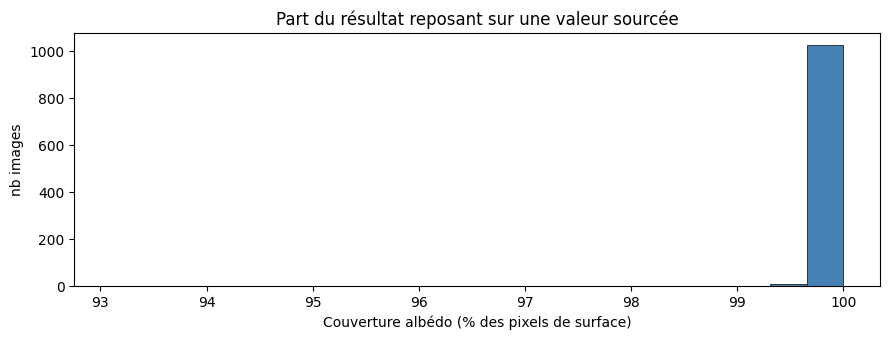

In [25]:

print("=== Couverture albedo (% des pixels de surface) ===")
print(df["couverture_albedo_pct"].describe().round(1).to_string())

manquants = np.zeros(43, dtype=np.int64)
for p in image_paths:
    sem   = load_semantic(p.stem)
    fused = cv2.imread(str(FUSED_DIR / f"{p.stem}_fused.png"), cv2.IMREAD_GRAYSCALE)
    if sem is None or fused is None:
        continue
    surface = (sem != 255) & ~np.isin(sem, list(EXCLUS_ALBEDO))
    sem_idx = np.where(surface, sem, 0).astype(np.int64)   # neutralise 255 avant indexation
    sans_src = surface & ~np.isfinite(alb_min[sem_idx, fused])
    manquants += np.bincount(fused[sans_src].ravel(), minlength=43)[:43]

tot_m = manquants.sum()
if tot_m > 0:
    print(f"\n=== Materiaux de surface SANS albedo source ({tot_m:,} px) ===")
    for j in np.argsort(manquants)[::-1][:10]:
        if manquants[j] > 0:
            print(f"  {BFMS_NAMES[j]:<32} {manquants[j]:>12,} px  ({manquants[j]/tot_m*100:5.1f} % des manquants)")
else:
    print("\nTous les pixels de surface ont un albedo source.")

fig, ax = plt.subplots(figsize=(9, 3.5))
ax.hist(df["couverture_albedo_pct"].dropna(), bins=20, color="steelblue", edgecolor="black", linewidth=0.5)
ax.set_xlabel("Couverture albédo (% des pixels de surface)")
ax.set_ylabel("nb images")
ax.set_title("Part du résultat reposant sur une valeur sourcée")
plt.tight_layout(); fig.savefig(OUTPUT_DIR / "couverture_albedo.png", dpi=150); plt.show()



=== % pixels corriges par le gating, par classe ===
       classe     pixels  pct_corriges
     sidewalk  864143321         99.37
         road  353298190         98.04
        fence   37619164         97.00
         wall   15812178         96.92
        truck    2829041         96.66
 traffic_sign    4067686         95.86
traffic_light      29586         95.75
          bus     182208         95.42
        train    1877274         94.24
     building  612624887         91.53
        rider      52711         90.89
         pole   14162396         90.73
   motorcycle     229629         82.60
      bicycle    2899649         74.09
          car   50037420         73.47
      terrain  134577459         72.22
       person  825850459         65.92
   vegetation 1051265813         31.73
          sky  940495201         27.40

=== Top 10 corrections (BFMS brut -> fusionne) ===
  Background                       -> Cement/Concrete             868,223,438 px
  Background                       

C:\Users\youss\AppData\Local\Temp\ipykernel_21848\3628276441.py:42: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(data, labels=[c.replace("albedo_", "") for c in cols])


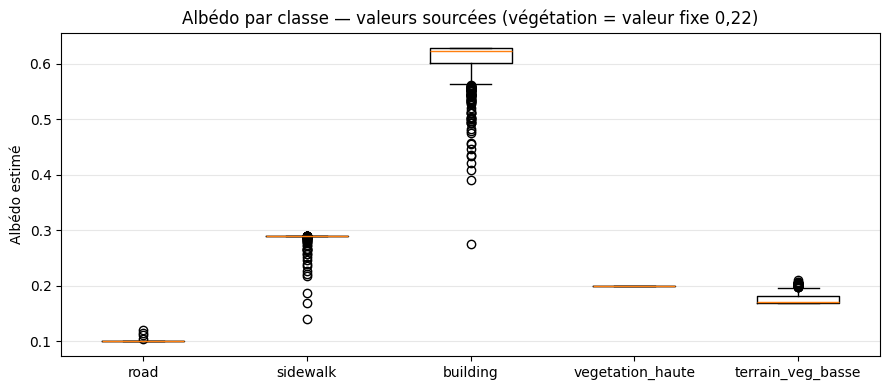

In [26]:

corr_par_classe = np.zeros(19, dtype=np.int64)
tot_par_classe  = np.zeros(19, dtype=np.int64)
transitions = {}

for p in image_paths:
    sem   = load_semantic(p.stem)
    bfms  = cv2.imread(str(BFMS_DIR / f"{p.stem}_bfms.png"), cv2.IMREAD_GRAYSCALE)
    fused = cv2.imread(str(FUSED_DIR / f"{p.stem}_fused.png"), cv2.IMREAD_GRAYSCALE)
    if sem is None or bfms is None or fused is None:
        continue
    valid = sem != 255
    diff = valid & (fused != bfms)
    for c in range(19):
        selc = valid & (sem == c)
        tot_par_classe[c]  += int(selc.sum())
        corr_par_classe[c] += int((diff & selc).sum())
    pairs, counts = np.unique(bfms[diff].astype(np.int32) * 43 + fused[diff], return_counts=True)
    for pr, ct in zip(pairs, counts):
        transitions[int(pr)] = transitions.get(int(pr), 0) + int(ct)

df_classes = pd.DataFrame({
    "classe": CITYSCAPES_ORDER, "pixels": tot_par_classe,
    "pct_corriges": np.round(corr_par_classe / np.maximum(tot_par_classe, 1) * 100, 2)})
df_classes = df_classes[df_classes["pixels"] > 0].sort_values("pct_corriges", ascending=False)
df_classes.to_csv(OUTPUT_DIR / "gating_par_classe.csv", index=False)
print("=== % pixels corriges par le gating, par classe ===")
print(df_classes.to_string(index=False))

print("\n=== Top 10 corrections (BFMS brut -> fusionne) ===")
for pr, ct in sorted(transitions.items(), key=lambda x: -x[1])[:10]:
    b, f = divmod(pr, 43)
    print(f"  {BFMS_NAMES[b]:<32} -> {BFMS_NAMES[f]:<26} {ct:>12,} px")

cols = ["albedo_road", "albedo_sidewalk", "albedo_building",
        "albedo_vegetation_haute", "albedo_terrain_veg_basse"]
print("\n=== Albedo moyen par classe (images ou la classe est presente) ===")
print(df[cols].describe().round(3).to_string())

data = [df[c].dropna() for c in cols]
if any(len(d) for d in data):
    fig, ax = plt.subplots(figsize=(9, 4))
    ax.boxplot(data, labels=[c.replace("albedo_", "") for c in cols])
    ax.set_ylabel("Albédo estimé"); ax.grid(alpha=0.3, axis="y")
    ax.set_title("Albédo par classe — valeurs sourcées (végétation = valeur fixe 0,22)")
    plt.tight_layout(); fig.savefig(OUTPUT_DIR / "albedo_par_classe.png", dpi=150); plt.show()



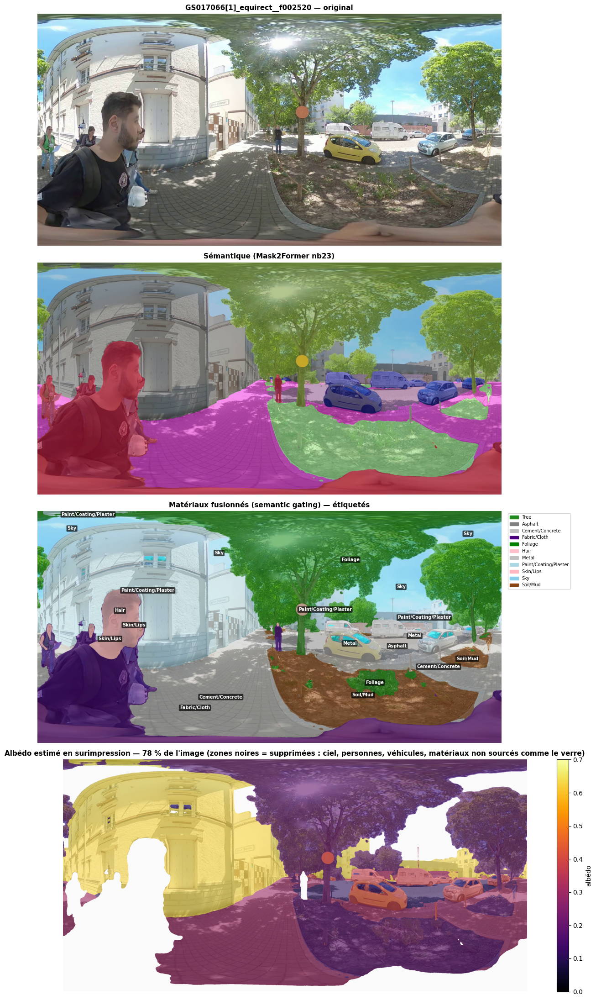

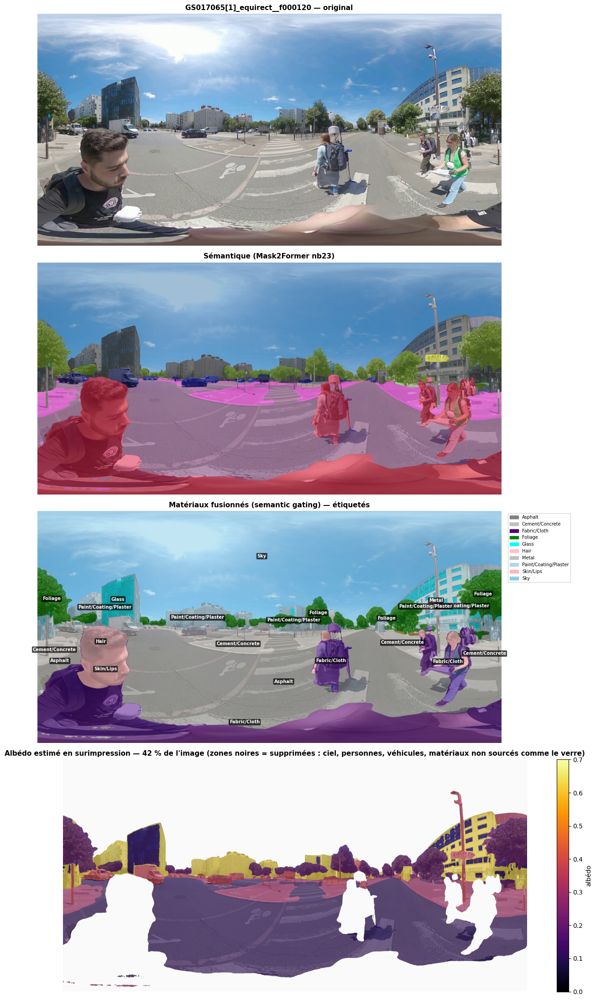

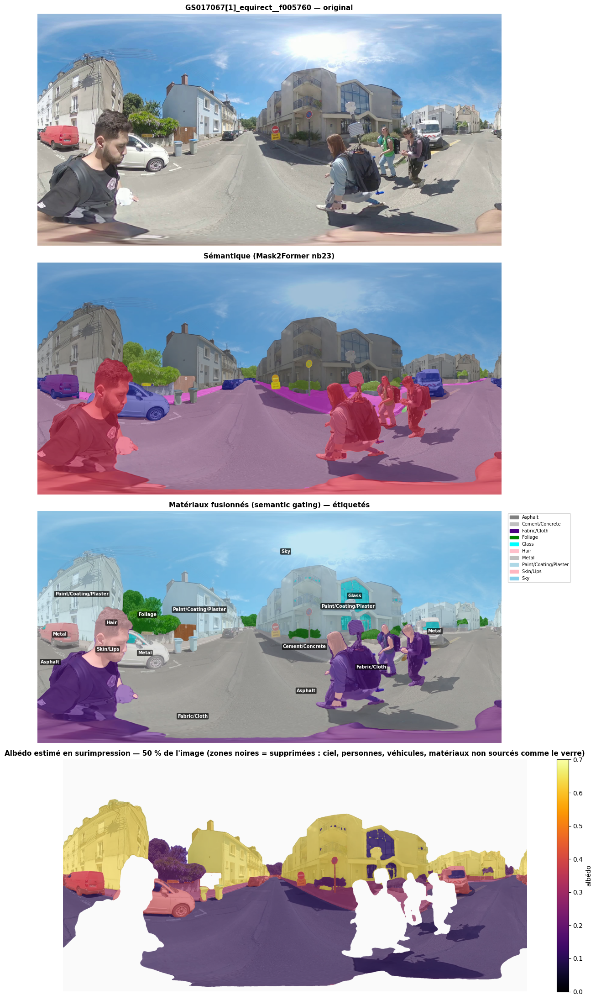

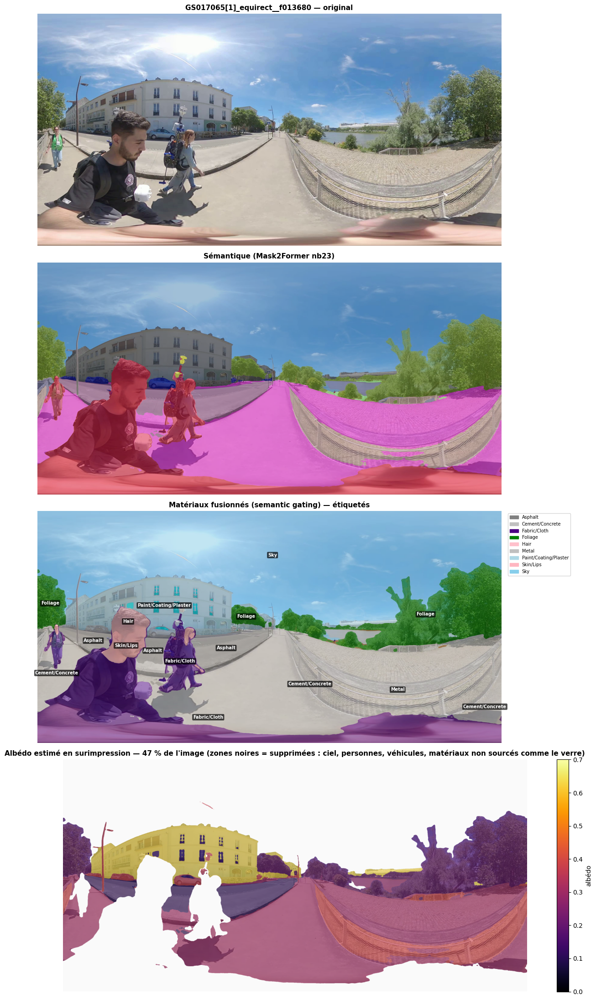

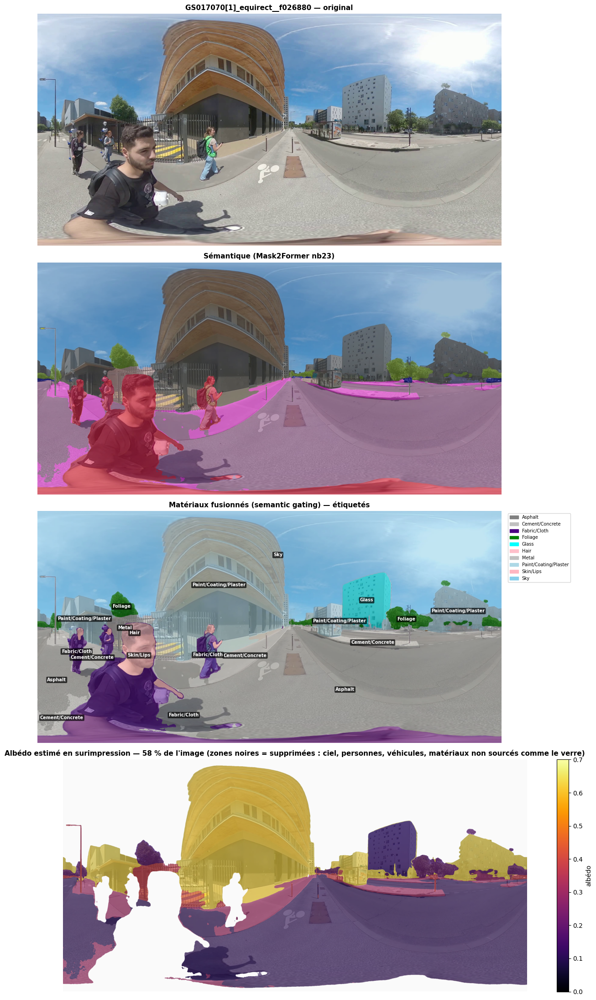

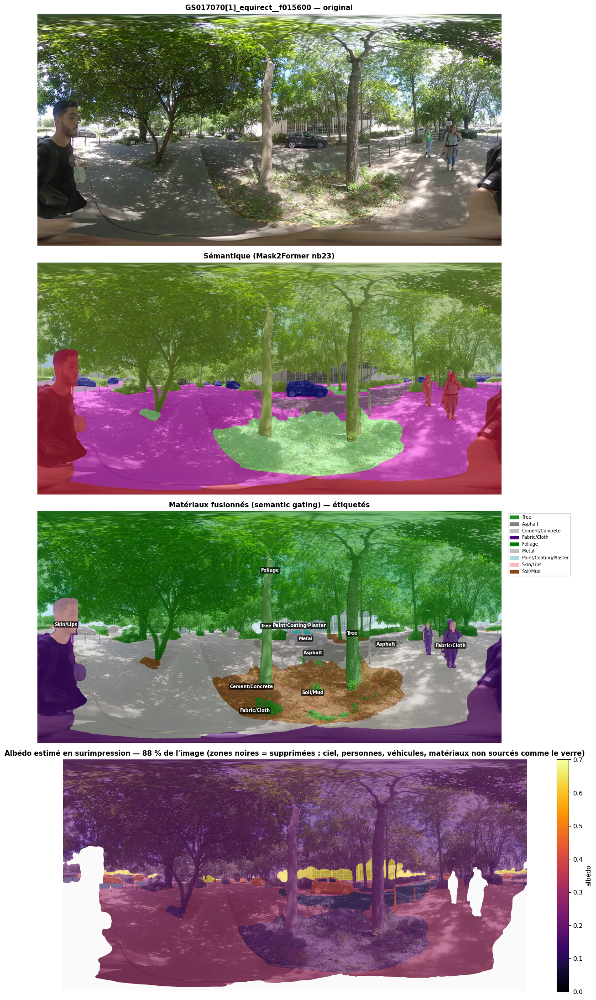

Visualisations : C:\Users\youss\Downloads\coolpath_local\data\outputs\fusion_3models_v2_1041\viz


In [27]:
from skimage.measure import label as cc_label, regionprops

def colorize_sem(mask):
    out = np.zeros((*mask.shape, 3), dtype=np.uint8)
    v = mask != 255
    out[v] = CITYSCAPES_PALETTE[mask[v]]
    return out


def draw_material_overlay(ax, img_rgb, fused, alpha=0.5, min_area_frac=0.004):
    """Materiaux fusionnes avec etiquettes de nom au centre des segments."""
    overlay = ((1 - alpha) * img_rgb + alpha * np.take(BFMS_COLORS, fused, axis=0)).astype(np.uint8)
    ax.imshow(overlay)
    h, w = fused.shape
    min_area = int(min_area_frac * h * w)
    present = []
    for cid in np.unique(fused):
        region = (fused == cid)
        if region.sum() < min_area:
            continue
        present.append(cid)
        labeled = cc_label(region.astype(np.uint8))
        for reg in regionprops(labeled):
            if reg.area >= min_area:
                cy, cx = reg.centroid
                ax.text(cx, cy, BFMS_NAMES[cid], ha="center", va="center",
                        fontsize=7, color="white", fontweight="bold",
                        bbox=dict(boxstyle="round,pad=0.2", facecolor="black",
                                  alpha=0.7, edgecolor="none"))
    ax.legend(handles=[Patch(color=BFMS_COLORS[c]/255.0, label=BFMS_NAMES[c]) for c in present],
              bbox_to_anchor=(1.01, 1), loc="upper left", fontsize=7)


def albedo_overlay(img_rgb, albedo, vmin=0.0, vmax=0.7, alpha=0.6, bg_color=(250, 250, 250)):
    """Superpose l'albedo (colormap inferno) sur l'image originale.
    Les pixels NaN (ciel, personnes, vehicules, materiaux non sources comme le verre)
    sont MASQUES (couleur unie sombre), pas laisses en image originale."""
    cmap = plt.get_cmap("inferno")
    norm = np.clip((albedo - vmin) / (vmax - vmin), 0, 1)
    valid = np.isfinite(albedo)
    colored = (cmap(np.nan_to_num(norm))[..., :3] * 255).astype(np.uint8)

    out = np.full_like(img_rgb, bg_color, dtype=np.uint8)   # fond sombre partout
    out[valid] = ((1 - alpha) * img_rgb[valid] + alpha * colored[valid]).astype(np.uint8)
    return out


for p in random.Random(1).sample(image_paths, min(6, len(image_paths))):
    img_rgb, _ = load_color(p)
    sem    = load_semantic(p.stem)
    fused  = cv2.imread(str(FUSED_DIR / f"{p.stem}_fused.png"), cv2.IMREAD_GRAYSCALE)
    albedo = np.load(ALBEDO_DIR / f"{p.stem}_albedo.npy")

    fig, axes = plt.subplots(4, 1, figsize=(14, 22))

    axes[0].imshow(img_rgb)
    axes[0].set_title(f"{p.stem} — original", fontweight="bold", fontsize=11)

    axes[1].imshow((0.5 * img_rgb + 0.5 * colorize_sem(sem)).astype(np.uint8))
    axes[1].set_title("Sémantique (Mask2Former nb23)", fontweight="bold", fontsize=11)

    draw_material_overlay(axes[2], img_rgb, fused)
    axes[2].set_title("Matériaux fusionnés (semantic gating) — étiquetés", fontweight="bold", fontsize=11)

    axes[3].imshow(albedo_overlay(img_rgb, albedo))
    couv = np.isfinite(albedo).mean() * 100
    axes[3].set_title(f"Albédo estimé en surimpression — {couv:.0f} % de l'image "
                      f"(zones noires = supprimées : ciel, personnes, véhicules, "
                      f"matériaux non sourcés comme le verre)",
                      fontweight="bold", fontsize=11)
    sm = plt.cm.ScalarMappable(cmap="inferno", norm=plt.Normalize(vmin=0.0, vmax=0.7))
    plt.colorbar(sm, ax=axes[3], fraction=0.025, label="albédo")

    for ax in axes:
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(VIZ_DIR / f"{p.stem}_fusion.png", dpi=95, bbox_inches="tight")
    plt.show()

print(f"Visualisations : {VIZ_DIR}")

## Vérification visuelle des codes RAL appariés

In [28]:
# --- Verification visuelle : codes RAL apparies sur une image ---
from matplotlib.patches import Patch

for p in random.Random(3).sample(image_paths, min(3, len(image_paths))):
    sem  = load_semantic(p.stem)
    bfms = cv2.imread(str(BFMS_DIR / f"{p.stem}_bfms.png"), cv2.IMREAD_GRAYSCALE)
    if sem is None or bfms is None:
        continue
    rgb, _ = load_color(p)
    valid = sem != 255
    fused = np.zeros_like(bfms)
    fused[valid] = gate_lut[sem[valid], bfms[valid]]
    sem_idx = np.where(valid, sem, 0).astype(np.int64)
    paint = alb_paint[sem_idx, fused]

    if not paint.any():
        print(f"{p.stem} : aucun pixel peinture, skip")
        continue

    alb_ral, idx_ral = apparier_ral(rgb, paint)

    # top 6 codes RAL apparies sur cette image
    vals, counts = np.unique(idx_ral[paint], return_counts=True)
    order = np.argsort(counts)[::-1][:6]

    overlay = rgb.copy()
    for k in order:
        code_i = vals[k]
        m = (idx_ral == code_i)
        col = df_ral.iloc[code_i][["R", "G", "B"]].values.astype(np.float64)
        overlay[m] = (0.35 * rgb[m] + 0.65 * col).astype(np.uint8)

    fig, axes = plt.subplots(2, 1, figsize=(14, 11))
    axes[0].imshow(rgb)
    axes[0].set_title(f"{p.stem} — original", fontweight="bold", fontsize=11)
    axes[1].imshow(overlay)
    axes[1].set_title("Codes RAL appariés sur les surfaces peintes "
                      "(couleur = teinte RAL officielle)", fontweight="bold", fontsize=11)
    axes[1].legend(handles=[
        Patch(color=df_ral.iloc[vals[k]][["R","G","B"]].values.astype(float)/255,
              label=f"{df_ral.iloc[vals[k]]['ral']} — α={df_ral.iloc[vals[k]]['albedo']:.3f} "
                    f"({counts[k]/paint.sum()*100:.0f} %)")
        for k in order], bbox_to_anchor=(1.01, 1), loc="upper left", fontsize=8)
    for ax in axes:
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(VIZ_DIR / f"{p.stem}_ral.png", dpi=100, bbox_inches="tight")
    plt.show()

print(f"Visualisations RAL : {VIZ_DIR}")

GS017067[1]_equirect__f001560 : aucun pixel peinture, skip
GS017066[1]_equirect__f001560 : aucun pixel peinture, skip
GS017069[1]_equirect__f014760 : aucun pixel peinture, skip
Visualisations RAL : C:\Users\youss\Downloads\coolpath_local\data\outputs\fusion_3models_v2_1041\viz
